In [1]:
import matplotlib as mpl
import eulerian_function as ef
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
import matplotlib.colors as mcolors
import cartopy
import xarray as xr
from mpl_toolkits.axes_grid1 import make_axes_locatable

mpl.rcParams['figure.dpi'] = 400

In [2]:
tpoints = ef.tpoints
regions = ef.regions
tpoints_true = ef.true_tpoints(tpoints)
regions_true = ef.true_regions(regions)
parameters = ef.parameters

In [3]:
#Args
background='no'
cyclone='min'
remove=['CRCM6-GEM5-UAA-SN', 'CRCM6-GEM5-UAA']

In [39]:
def plot_map(background=background, cyclone=cyclone, model='All', remove='False', save='False', region='All', region_display='False', tpoint_display='False'):

   _, _, _, ds_era, ds_without_era, ds_minus_era = ef.pre_process(background, cyclone, region, remove)

   for var in ef.variables:

      for mode_era5 in ['yes','no']:

        if mode_era5=='yes':
            mm1 = 7
            mm2 = len(parameters)
            add2 = 'ERA5'
        else:
            mm1 = 0
            mm2 = len(parameters)

        for mm, met in enumerate(parameters[mm1:mm2]):

            ax = plt.subplot(projection=ccrs.PlateCarree()) #axes?

            if mode_era5=='yes':
                if met in ['slope', 'asymm']:
                    ds_mean = ds_era[var].sel(parameters=met) * 36.
                elif met in ['min']:
                    ds_mean = ds_era[var].sel(parameters=met)

                fig_name = ef.path_out+'ERA5_'+var+'_'+met+'_'+background+'-background_'+cyclone+'-cyclone''.png'

            elif model == 'All':
                if met in ['slope', 'asymm']:
                    ds_mean = ds_minus_era[var].sel(parameters=met).mean(dim='models') * 36.
                    add2 = 'bias'
                elif met in ['min']:
                    ds_mean = ds_minus_era[var].sel(parameters=met).mean(dim='models')
                    add2 = 'bias'
                else:
                    ds_mean = ds_without_era[var].sel(parameters=met).mean(dim='models')
                    add2 = 'mae'

                fig_name = ef.path_out+add2+'_'+var+'_'+met+'_ensmean'+'_'+background+'-background_'+cyclone+'-cyclone''.png'

            else:
                if met in ['slope', 'asymm']:
                    ds_mean = ds_minus_era[var].sel(parameters=met, models=model) * 36.
                    add2 = 'bias'
                elif met in ['min']:
                    ds_mean = ds_minus_era[var].sel(parameters=met, models=model)
                    add2 = 'bias'
                else:
                    ds_mean = ds_without_era[var].sel(parameters=met, models=model)
                    add2 = 'mae'

                fig_name = ef.path_out+add2+'_'+var+'_'+met+'_'+model+'_'+background+'-background_'+cyclone+'-cyclone''.png'

            if met in ['min_mae', 'slope_mae', 'asymm_mae']:
                if model == 'All':
                    ds_mean = 100. * (ds_without_era[var].sel(parameters=met).mean(dim='models') / ds_without_era[var].sel(parameters='total_aae').mean(dim='models'))
                else :
                    ds_mean = 100. * (ds_without_era[var].sel(parameters=met, models=model) / ds_without_era[var].sel(parameters='total_aae', models=model))

            if var=='psl' and met != 'error':
                # if met in ['slope','asymm']:
                #     add3 = str(ef.round_to_2(np.nanmean(ds_mean.values)))+' $hPa.h^{-1}$'
                if met in ['slope','asymm', 'min','total_mae','linear_mae','total_aae']:
                    add3 = str(ef.round_to_2(np.nanmean(ds_mean.values)))+' $hPa$'
                else:
                    add3 = str(ef.round_to_2(np.nanmean(ds_mean.values)))+' %'
            elif var=='huss' and met != 'error':
                # if met in ['slope','asymm']:
                    # add3 = str(ef.round_to_2(np.nanmean(ds_mean.values)))+' $g.kg^{-1}.h^{-1}$'
                if met in ['slope','asymm', 'min','total_mae','linear_mae','total_aae']:
                    add3 = str(ef.round_to_2(np.nanmean(ds_mean.values)))+' $g.kg^{-1}$'
                else:
                    add3 = str(ef.round_to_2(np.nanmean(ds_mean.values)))+' %'
            else:
                add3 = str(int(ef.round_to_2(np.nanmean(ds_mean.values))))+' %'

            ax.text(0.015, 0.975, add3, bbox=dict(facecolor='white', alpha=0.9), 
                    horizontalalignment='left', verticalalignment='top', 
                    transform=ax.transAxes, fontsize=9)

            ds_mean_abs_max = 1.*np.max([ds_mean.max(), np.abs(ds_mean.min())])

            if ds_mean_abs_max >= 3:
                ds_mean_abs_max = int((1.*np.max([ds_mean.max(),np.abs(ds_mean.min())])))
            else:
                ds_mean_abs_max = 0.01*float(int((1.*np.max([100.*ds_mean.max(),np.abs(100.*ds_mean.min())]))))

            if ds_mean.min() >= 0 and add2 != 'bias':
                min_lev = 0
            else:
                min_lev = -ds_mean_abs_max

            if ds_mean.max() <= 0 and add2 != 'bias':
                max_lev = 0
            else:
                max_lev = ds_mean_abs_max

            if met in ['min_mae','slope_mae','asymm_mae']:
                cmap = plt.get_cmap('viridis')
                min_lev = 0
                max_lev = 100

            if met in ['error']:
                cmap = plt.get_cmap('YlOrBr')
                max_lev = 35

            if met in ['total_mae', 'linear_mae']:
                cmap = plt.get_cmap('YlGnBu')#winter_r

            if met in ['min','slope']:
                cmap = plt.get_cmap('cividis')#viridis

            if met in ['asymm']:
                cmap = plt.get_cmap('RdBu_r')

            if max_lev != 0 and min_lev != 0:
                cmap = plt.get_cmap('RdBu_r')

            if model == 'All' and mode_era5 == 'no' and met in ['min', 'slope', 'asymm']: 
                bin = (max_lev - min_lev) / 20.
            else:
                bin = (max_lev - min_lev) / 10.

            if var == 'psl':
                if mode_era5 == 'yes':
                    if met == 'slope':
                        min_lev = 0
                        max_lev = 66
                    elif met == 'min':
                        min_lev = -66
                        max_lev = 0
                elif mode_era5 == 'no' and met in ['min', 'slope']:
                    min_lev = -25
                    max_lev = 25
                bin = (max_lev - min_lev) / 10.

            if var == 'huss':
                if mode_era5 == 'no':
                    if met in ['min', 'slope']:
                        min_lev = -6
                        max_lev = 6
                        bin = (max_lev - min_lev) / 12.
                    elif met == 'asymm':
                        min_lev = -2.5
                        max_lev = 2.5
                        bin = (max_lev - min_lev) / 10.


            n_levs = 1 + np.ceil((max_lev - min_lev) / bin)
            clevs = min_lev + np.arange(n_levs) * bin
            norm = mcolors.BoundaryNorm(clevs, cmap.N)

            if var=='psl':
                name_par = ef.name_parp
            else:
                name_par = ef.name_parq
                        
            # ax.add_feature(cartopy.feature.LAND, zorder=0, linewidth=0.3, edgecolor='black')
            ax.add_feature(cartopy.feature.LAKES, zorder=1, linewidth=0.3, edgecolor='black', facecolor='none')
            ax.add_feature(cartopy.feature.BORDERS, linewidth=0.5, edgecolor='black', zorder=2)
            # states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lines', scale='50m', facecolor='none')
            # ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
            ax.coastlines(resolution='50m', linewidth=0.4, color='black')
            ax.gridlines(draw_labels=True, linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
            # ax.set_extent([ds_mean.longitude.min(), ds_mean.longitude.max(), ds_mean.latitude.min(),ds_mean.latitude.max()], crs=ccrs.PlateCarree())
            # gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
            # gl.xformatter = LONGITUDE_FORMATTER
            # gl.yformatter = LATITUDE_FORMATTER
            ax.gridlines(draw_labels=True, linewidth=0.5, linestyle='--', color='k',
                        alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10), crs=ccrs.PlateCarree())
            xticks = np.arange(-180, 180, 30)
            yticks = np.arange(-90, 90, 20)
            ax.set_xticks(xticks, crs=ccrs.PlateCarree())
            ax.set_yticks(yticks, crs=ccrs.PlateCarree())
            ax.set_xticklabels([f"{lon}°" for lon in xticks], fontsize=9)
            ax.set_yticklabels([f"{lat}°" for lat in yticks], fontsize=9)
            ax.set_extent([ef.lons.min(), ef.lons.max(), ef.lats.min(), ef.lats.max()], crs=ccrs.PlateCarree())
                

            # plt.pcolormesh(lons, lats, ds_mean, transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)
 
            mesh = ax.pcolormesh(ds_mean.longitude, ds_mean.latitude, ds_mean, transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)
            # if model=='All' and mode_era5!='yes' and met in ['min','slope','asymm']:
            #     clb = plt.colorbar(shrink=0.6, format='%.0f')
            # else:
            if ds_mean_abs_max > 10:
                clb = plt.colorbar(mesh, ax=ax, shrink=0.6, format='%.0f')
            elif ds_mean_abs_max < 1:
                clb = plt.colorbar(mesh, ax=ax, shrink=0.6, format='%.2f')
            else:
                clb = plt.colorbar(mesh, ax=ax, shrink=0.6, format='%.1f')

            if var == 'psl':
                if met in ['asymm', 'slope', 'min']:
                    label = name_par[met] if mode_era5 == 'yes' else name_par[met + '_bias']
                    unit = ' (hPa)'
                elif met in ['total_mae', 'linear_mae', 'total_aae']:
                    label = name_par[met]
                    unit = ' (hPa)'
                else:
                    label = name_par[met]
                    unit = ' (%)'
            else:
                if met in ['asymm', 'slope', 'min']:
                    label = name_par[met] if mode_era5 == 'yes' else name_par[met + '_bias']
                    unit = ' (g.kg$^{-1}$)'
                elif met in ['total_mae', 'linear_mae', 'total_aae']:
                    label = name_par[met]
                    unit = ' (g.kg$^{-1}$)'
                else:
                    label = name_par[met]
                    unit = ' (%)'

            clb.set_label(label + unit, fontsize=17)
            
            clb.ax.tick_params(labelsize=12)
            
            ############################################################################################################################################################
            if region_display != 'False':
                for region in dict(list(regions_true.items())[:4]): #regions_true
                    w = regions_true[region]
                    ax.plot([w[0], w[1], w[1], w[0], w[0]], [w[2], w[2], w[3], w[3], w[2]], linestyle='--', linewidth=1, color='black', transform=ccrs.PlateCarree())
            
            if tpoint_display != 'False':
                tpoints_true = true_tpoints(tpoint_display)
                for point in tpoints_true.keys():
                    ax.scatter(tpoints_true[point][0], tpoints_true[point][1], s=10, zorder=4, alpha=0.2, color='k', marker='s', transform=ccrs.PlateCarree())
            ############################################################################################################################################################        
            
            # if mode_era5=='yes':
            #     plt.title('ERA5 - '+met)
            # elif model == 'All':
            #     plt.title('Models mean - '+met)
            # else:
                # plt.title(model+' - '+met)
            # plt.show()
            # plt.close()
            if save=='True': plt.savefig(fig_name, bbox_inches='tight', dpi=300)
            plt.show()                                                                                 
            plt.close()

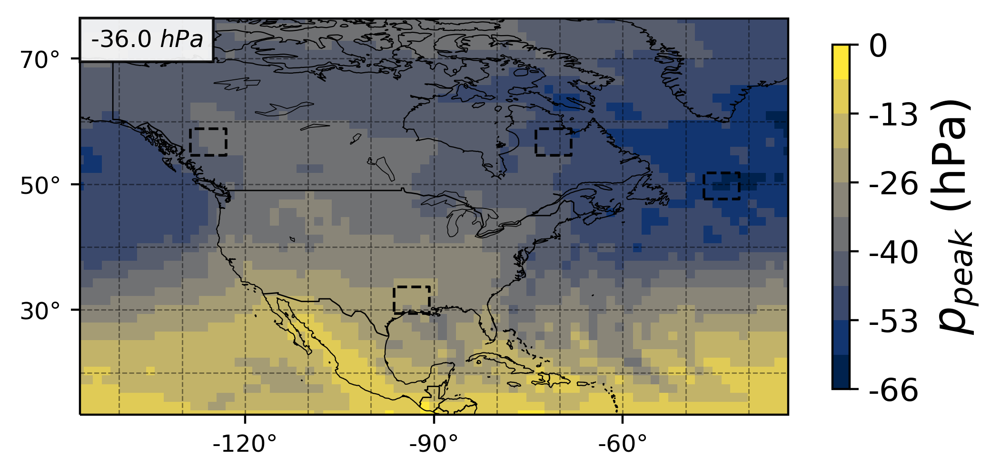

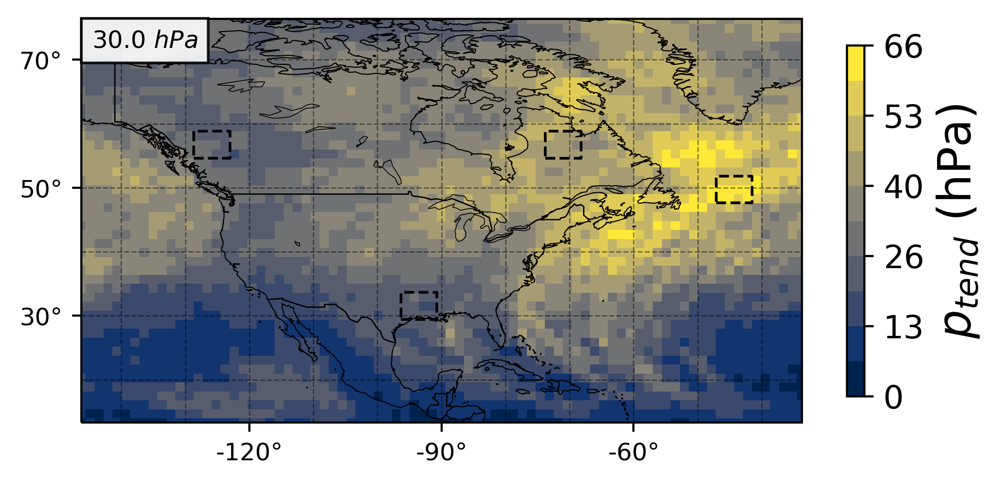

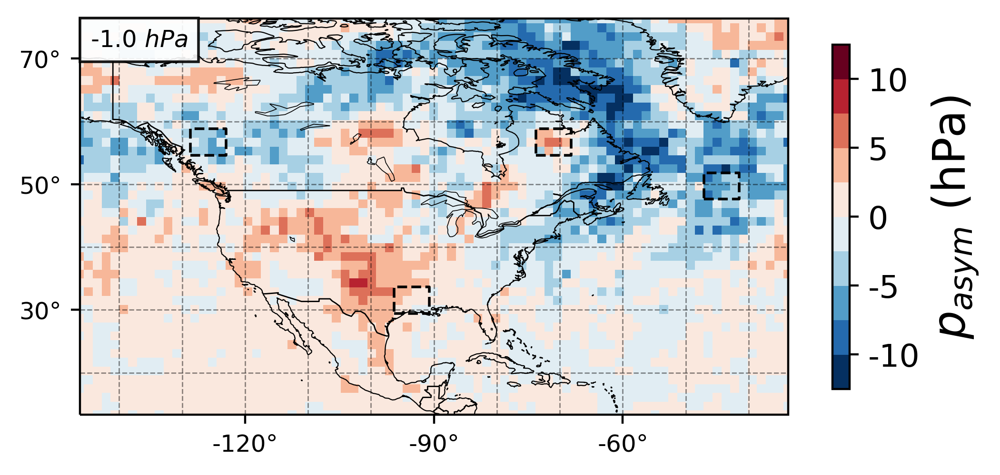

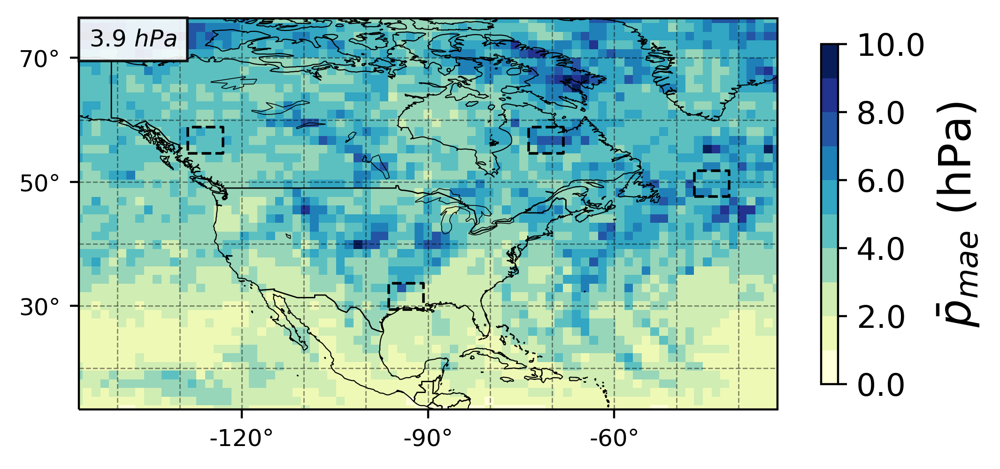

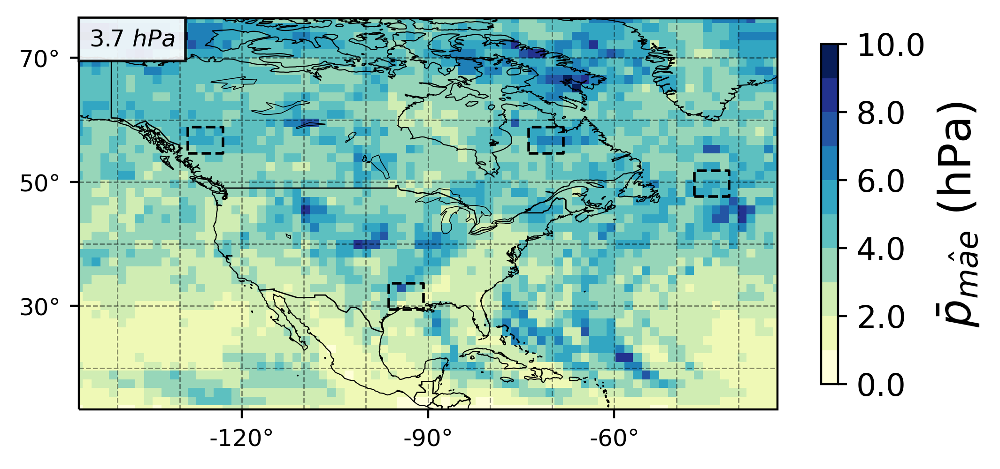

...

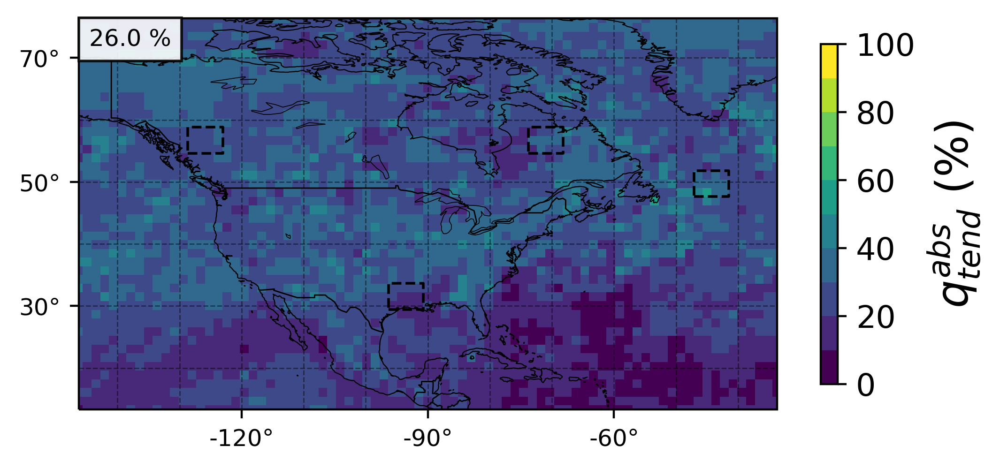

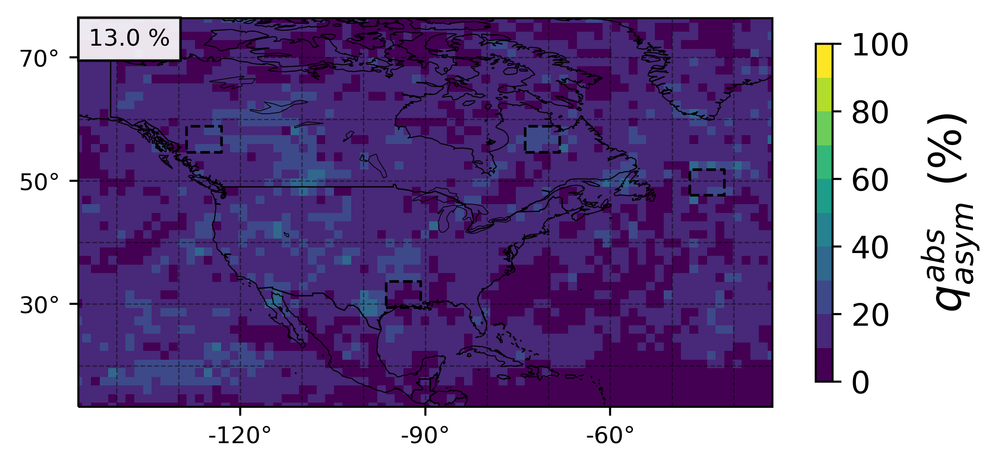

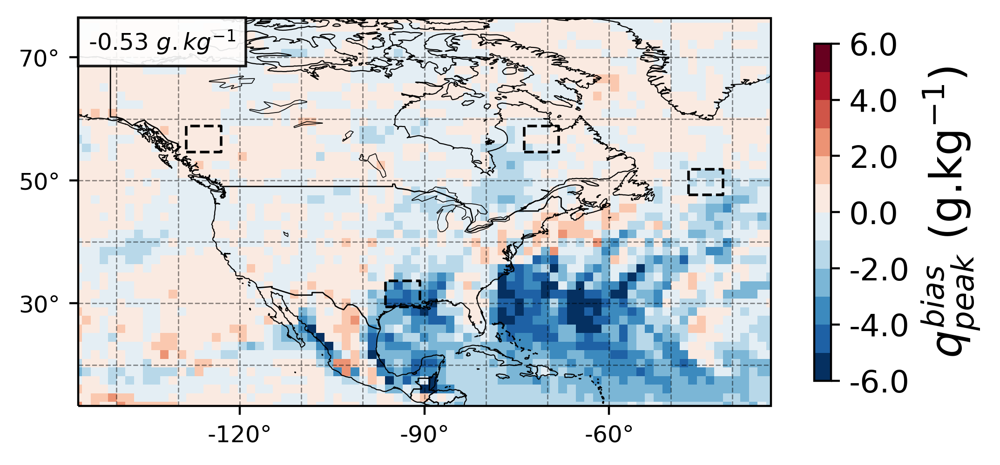

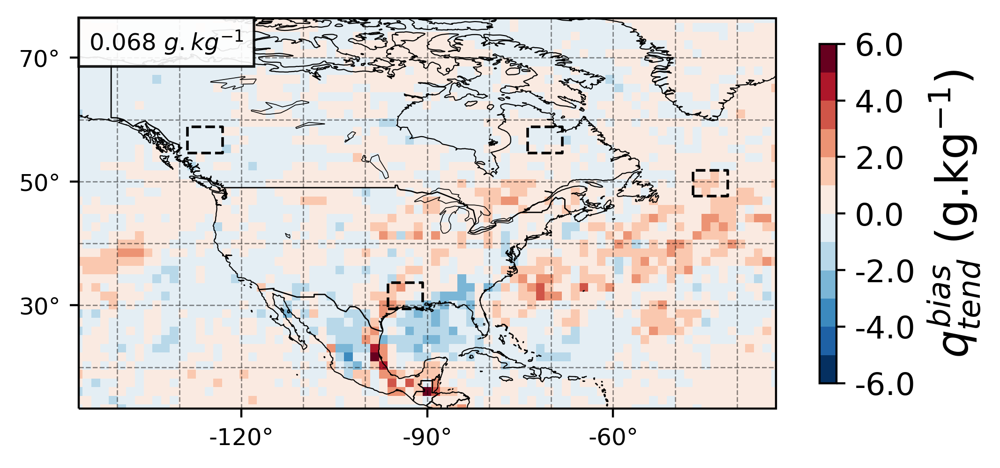

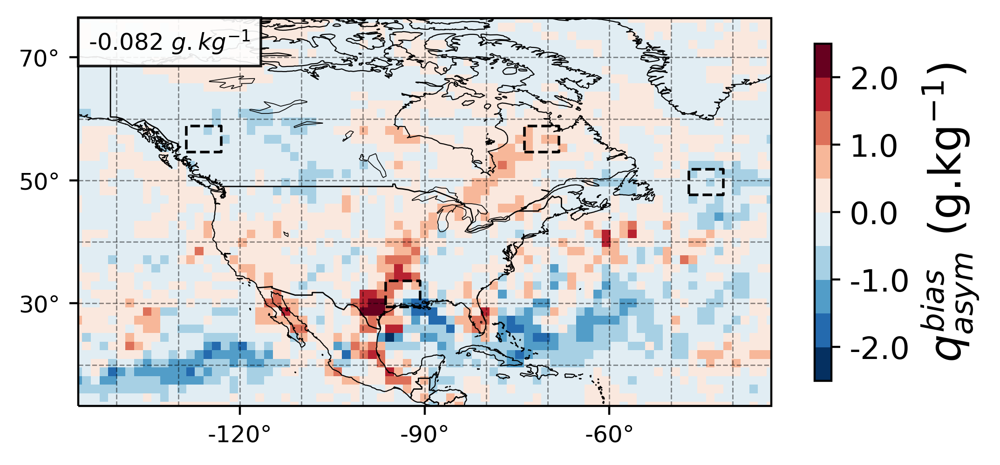

In [40]:
plot_map(remove=remove, save='False', region_display='True')

In [ ]:
def plot_map_date(model, background=background, cyclone=cyclone, tpoints='False', top=7, data='pixel', date='season'):

    fig_name = ef.path_out+'map_date_'+model+'_'+date+'_'+data+'_'+background+'-background_'+cyclone+'-cyclone''.png'

    if top == 'All':
        ds = xr.open_mfdataset('/home/demeyer/DATA/TRACKING/EULERIAN/OUTPUTS/'+background+'_background/date_extreme/Date_with_psl_'+cyclone+'_'+model+'.nc4')
        number_of_years = len(ds.year.values)
    else:
        ds = xr.open_mfdataset('/home/demeyer/DATA/TRACKING/EULERIAN/OUTPUTS/'+background+'_background/date_extreme/Date_with_psl_'+cyclone+'_'+model+'_7_years.nc4')
        number_of_years = 7
        
    if data=='scatter':
        lon, lat = np.meshgrid(ds.lon, ds.lat)
        lon = lon.flatten()
        lat = lat.flatten()

    fig, ax = plt.subplots(figsize=(12, 12), subplot_kw=dict(projection=ccrs.PlateCarree()))
    ax.set_extent([ef.lons.min(), ef.lons.max(), ef.lats.min(), ef.lats.max()], crs=ccrs.PlateCarree())
    ax.add_feature(cartopy.feature.LAKES, zorder=1, linewidth=1.2, edgecolor='black', facecolor='none')
    ax.add_feature(cartopy.feature.BORDERS, linewidth=1.2, edgecolor='black', zorder=2)
    ax.coastlines(resolution='50m', linewidth=1.2, color='black')
    ax.gridlines(draw_labels=True, linewidth=0.5, linestyle='--', color='k',
                alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10), crs=ccrs.PlateCarree())
    xticks = np.arange(-180, 180, 30)
    yticks = np.arange(-90, 90, 20)
    ax.set_xticks(xticks, crs=ccrs.PlateCarree())
    ax.set_yticks(yticks, crs=ccrs.PlateCarree())
    ax.set_xticklabels([f"{lon}°" for lon in xticks], fontsize=12)
    ax.set_yticklabels([f"{lat}°" for lat in yticks], fontsize=12)
    ax.set_extent([ef.lons.min(), ef.lons.max(), ef.lats.min(), ef.lats.max()], crs=ccrs.PlateCarree())

    for region in dict(list(regions_true.items())[:4]): #regions_true
        w = regions_true[region]
        ax.plot([w[0], w[1], w[1], w[0], w[0]], [w[2], w[2], w[3], w[3], w[2]], linestyle='--', linewidth=2, color='black', transform=ccrs.PlateCarree())

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.20, axes_class=plt.Axes)

    if date == 'season':
        ds_count = ef.mode(ds.season, dim='year', mode='count')
        ds_count = ds_count / number_of_years * 100
        ds_mode = ef.mode(ds.season, dim='year', mode='mode')

        colors = ['#7eb7de', '#2ca02c', '#ff7f0e', '#d62728']  # Winter, Spring, Summer, Fall
        cmap = mcolors.ListedColormap(colors)
        labels = ['Winter', 'Spring', 'Summer', 'Fall']

        if data=='scatter':
            if top == 'All':
                timeofthemin = ds_mode.where(ds_count > 0.).values.transpose().flatten()
            else:
                timeofthemin = ds_mode.where(ds_count > 0.).values.flatten()	
            im = ax.scatter(lon, lat, c=timeofthemin, cmap=cmap, transform=ccrs.PlateCarree(), lw=6, vmin=0.5, vmax=4.5)
        else:
            im = ds_mode.where(ds_count > 0.).plot.pcolormesh(x='lon', y='lat', ax=ax, cmap=cmap, transform=ccrs.PlateCarree(), add_colorbar=False, vmin=0.5, vmax=4.5)
        cs = ds_count.where(ds_count > 0.).plot.contour(x='lon', y='lat', ax=ax, colors='k', levels=np.arange(0,110,25), linewidths=0.5, transform=ccrs.PlateCarree())
        cb = plt.colorbar(im, orientation="vertical", cax=cax, ticks = [1, 2, 3, 4])
        # cb.ax.set_ylabel("Most frequent season", fontsize=14)
        cb.set_ticklabels(labels)
        cb.ax.tick_params(labelsize=16)

    if date == 'month':
        ds_count = mode(ds.month, dim='year', mode='count')
        ds_count = ds_count / number_of_years * 100
        ds_mode = mode(ds.month, dim='year', mode='mode')

        cmap = plt.get_cmap('twilight_r', 12)

        if data=='scatter':
            if top == 'All':
                timeofthemin = ds_mode.where(ds_count > 0.).values.transpose().flatten()
            else:
                timeofthemin = ds_mode.where(ds_count > 0.).values.flatten()	
            im = ax.scatter(lon, lat, c=timeofthemin, cmap=cmap, transform=ccrs.PlateCarree(), lw=6, vmin=0.5, vmax=12.5)
        else:
            im = ds_mode.where(ds_count > 0.).plot.pcolormesh(x='lon', y='lat', ax=ax, cmap=cmap, transform=ccrs.PlateCarree(), add_colorbar=False, vmin=0.5, vmax=12.5)
        cs = ds_count.where(ds_count > 0.).plot.contour(x='lon', y='lat', ax=ax, colors='k', levels=np.arange(0,110,25), linewidths=0.5, transform=ccrs.PlateCarree())
        ax.set_title(ds.model.item()+', 1980-2015')
        cb = plt.colorbar(im, orientation="vertical", cax=cax, label="Most frequent month", ticks=np.arange(1, 13))
        cb.set_ticklabels([calendar.month_name[i] for i in range(1, 13)])
    
    if date == 'week':
        ds_count = mode(ds.week, dim='year', mode='count')
        ds_count = ds_count / number_of_years * 100
        ds_mode = mode(ds.week, dim='year', mode='mode')

        cmap = plt.get_cmap('twilight_r', 52)

        if data=='scatter':
            if top == 'All':
                timeofthemin = ds_mode.where(ds_count > 0.).values.transpose().flatten()
            else:
                timeofthemin = ds_mode.where(ds_count > 0.).values.flatten()	
            im = ax.scatter(lon, lat, c=timeofthemin, cmap=cmap, transform=ccrs.PlateCarree(), lw=6, vmin=0.5, vmax=52.5)
        else:
            im = ds_mode.where(ds_count > 0.).plot.pcolormesh(x='lon', y='lat', ax=ax, cmap=cmap, transform=ccrs.PlateCarree(), add_colorbar=False, vmin=0.5, vmax=52.5)
        cs = ds_count.where(ds_count > 0.).plot.contour(x='lon', y='lat', ax=ax, colors='k', levels=np.arange(0,110,25), linewidths=0.5, transform=ccrs.PlateCarree())    
        cb = plt.colorbar(im, orientation="vertical", cax=cax, label="Most frequent week", ticks=np.arange(1, 53, 4))
        cb.set_ticklabels(np.arange(1, 53, 4))
        
    ax.clabel(cs, cs.levels, fmt='%d', inline=True, fontsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    # if top == 'All':
    #     ax.set_title(ds.model.item()+', 1980-2015')
    # else:
    #     ax.set_title(ds.model.item()+', 7 strongest years within 1980-2015')
    if tpoints != 'False':
        for point in tpoints.keys():
            ax.plot(tpoints[point][0],tpoints[point][1], color='k', linewidth=12, marker='o', transform=ccrs.PlateCarree())

    # plt.savefig(fig_name, bbox_inches='tight', dpi=400)
    plt.show()                                                                                 
    plt.close()

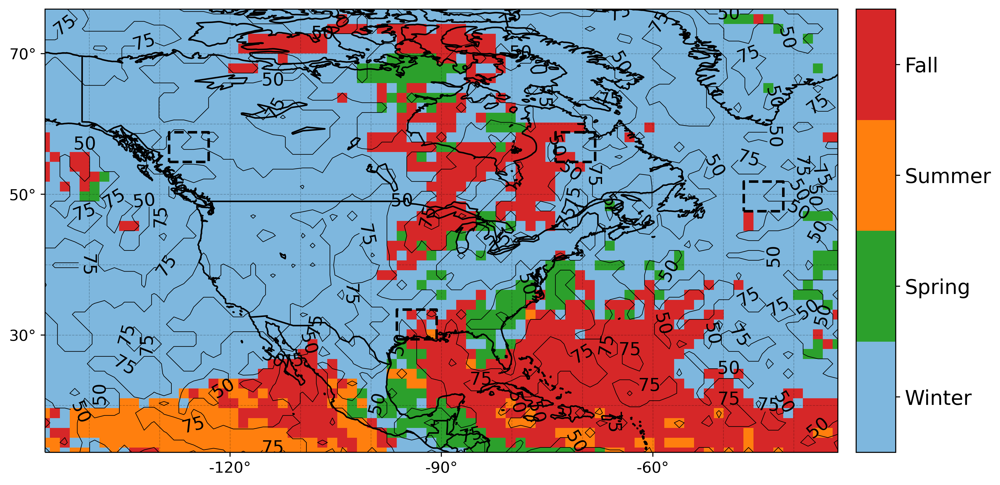

In [38]:
plot_map_date(model='ERA5', top=7, data='pixel', date='season')